<a href="https://colab.research.google.com/github/djmoffat/HOSSS-19/blob/master/HOSS_hacking2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip install https://github.com/interactiveaudiolab/nussl/archive/clustering.zip
!pip install --upgrade git+https://github.com/sigsep/sigsep-mus-db.git@v3#egg=musdb
!pip install museval
!pip install https://github.com/pseeth/scaper/archive/master.zip

     \ 3.0MB 31.5MB/s
  Stored in directory: /tmp/pip-ephem-wheel-cache-88q8l687/wheels/aa/27/45/3d7c9bc6d0d96b6b4b1dfa656b0a8825340f1ec4b0dced2e13
Successfully built nussl
  Cloning https://github.com/sigsep/sigsep-mus-db.git (to revision v3) to /tmp/pip-install-7on4fey4/musdb
  Running command git clone -q https://github.com/sigsep/sigsep-mus-db.git /tmp/pip-install-7on4fey4/musdb
  Running command git checkout -b v3 --track origin/v3
  Switched to a new branch 'v3'
  Branch 'v3' set up to track remote branch 'v3' from 'origin'.
  Stored in directory: /tmp/pip-ephem-wheel-cache-q54wbyx4/wheels/e3/9a/f9/23984e1f7bdd72886c5e62349e33243511abee363854f62ed5
Successfully built musdb
  Found existing installation: musdb 0.2.3
    Uninstalling musdb-0.2.3:
      Successfully uninstalled musdb-0.2.3


     | 67.4MB 619kB/s
  Stored in directory: /tmp/pip-ephem-wheel-cache-0hk0enk7/wheels/33/06/8f/5405f570fad861221bdf535ab5051b50aaa0f61feac19b3353
Successfully built scaper


In [0]:
import musdb
from nussl import jupyter_utils, AudioSignal
mus = musdb.DB(download=True)
mus[0].audio
audio_signal = AudioSignal(audio_data_array=mus[0].audio, sample_rate=mus[0].rate)
jupyter_utils.embed_audio(audio_signal)

audio_signal = AudioSignal(audio_data_array=mus[0].targets['vocals'].audio, sample_rate=mus[0].rate)
jupyter_utils.embed_audio(audio_signal)

# NUSSL demo

1. Install the requirements using the cell aboe
2. Run on an example audio file with one of our deep clustering audio models below

## Music separation

Saving file at /tmp/.nussl/audio/schoolboy_fascination_excerpt.wav
schoolboy_fascination_excerpt.wav...100%
Saving file at /tmp/.nussl/models/vocals_44k_coherent.pth
vocals_44k_coherent.pth...100%


/usr/local/lib/python3.6/dist-packages/nussl/core/audio_signal.py:1686: UserWarning: Cannot resample to the same sample rate.
  warnings.warn('Cannot resample to the same sample rate.')


/usr/local/lib/python3.6/dist-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


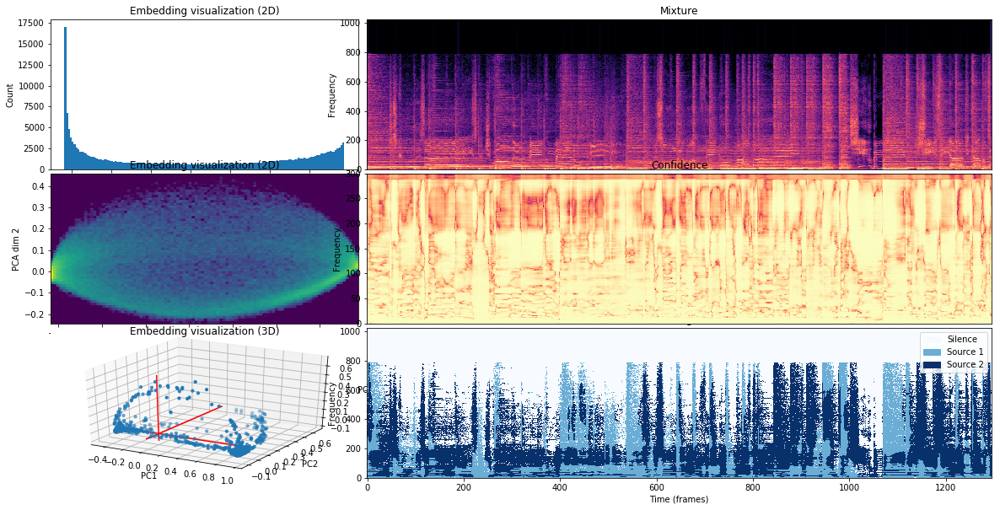

In [0]:
from nussl import efz_utils, jupyter_utils, AudioSignal, DeepClustering
import matplotlib.pyplot as plt
%matplotlib inline

audio_file = efz_utils.download_audio_file('schoolboy_fascination_excerpt.wav')
# see more models and audio files @ http://nussl.ci.northwestern.edu/
model_path = efz_utils.download_trained_model('vocals_44k_coherent.pth')

audio_signal = AudioSignal(audio_file)
separator = DeepClustering(
    audio_signal,
    model_path=model_path,
    num_sources=2,
    clustering_type='kmeans',
    percentile=95,
)
separator.run()

# Mixture
jupyter_utils.embed_audio(audio_signal)
signals = separator.make_audio_signals()
# Each source
for s in signals:
  jupyter_utils.embed_audio(s)
  
plt.figure(figsize=(20, 10))
separator.plot()
plt.tight_layout()
plt.show()

## Speech separation

Matching file found at /tmp/.nussl/audio/wsj_speech_mixture_ViCfBJj.mp3, skipping download.
Matching file found at /tmp/.nussl/models/speech_wsj8k.pth, skipping download.


/usr/local/lib/python3.6/dist-packages/nussl/core/audio_signal.py:1686: UserWarning: Cannot resample to the same sample rate.
  warnings.warn('Cannot resample to the same sample rate.')


/usr/local/lib/python3.6/dist-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


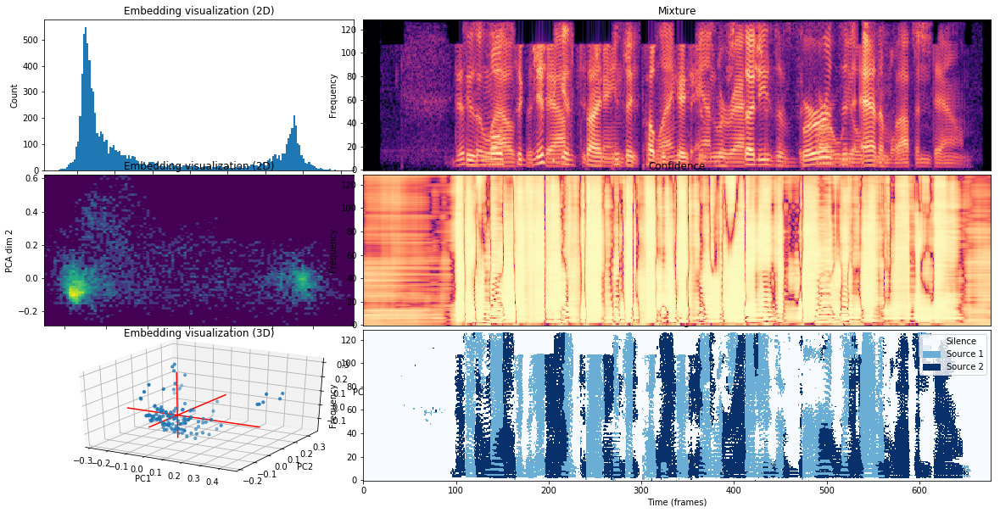

In [0]:
from nussl import efz_utils, jupyter_utils, AudioSignal, DeepClustering
import matplotlib.pyplot as plt
%matplotlib inline

audio_file = efz_utils.download_audio_file('wsj_speech_mixture_ViCfBJj.mp3')
# see more models and audio files @ http://nussl.ci.northwestern.edu/
model_path = efz_utils.download_trained_model('speech_wsj8k.pth')

audio_signal = AudioSignal(audio_file)
separator = DeepClustering(
    audio_signal,
    model_path=model_path,
    num_sources=2,
    clustering_type='kmeans',
    percentile=95,
)
separator.run()

# Mixture
jupyter_utils.embed_audio(audio_signal)
signals = separator.make_audio_signals()
# Each source
for s in signals:
  jupyter_utils.embed_audio(s)
  
plt.figure(figsize=(20, 10))
separator.plot()
plt.tight_layout()
plt.show()

In [0]:
mus[0].audio.shape

(300032, 2)

## Training a model

In [0]:
from nussl.deep import datasets
from nussl.deep.config import defaults, build_dpcl_config
from nussl.deep import SeparationModel
from nussl.deep.train import Trainer
from multiprocessing import cpu_count
import numpy as np
from nussl import AudioSignal

class MUSDBDataset(datasets.base_dataset.BaseDataset):
  def __init__(self, mus, folder, options):
    self.folder = 'musdb'
    self.mus = mus
    super().__init__(self.folder, options)
    
  def get_files(self, folder):
    return range(len(self.mus))
  
  def load_audio_files(self, index):
    rate = self.mus[index].rate
    mix = np.mean(self.mus[index].audio, axis=-1).T
    vocals = np.mean(self.mus[index].targets['vocals'].audio, axis=-1).T
    acc = mix - vocals
    
    mix_signal = self.make_audio_signal(mix, rate)
    vocals_signal = self.make_audio_signal(vocals, rate)
    acc_signal = self.make_audio_signal(acc, rate)
    return mix_signal, [vocals_signal, acc_signal], np.eye(2)
  
  def make_audio_signal(self, data, rate):
    audio_signal = AudioSignal(audio_data_array=data, sample_rate=rate)
    audio_signal.stft_params.window_length = self.options['n_fft']
    audio_signal.stft_params.hop_length = self.options['hop_length']
    return audio_signal
  
  def get_weights(self, data_dict, weight_type):
    weights = np.ones(data_dict['magnitude_spectrogram'].shape)
    return weights
  

    
dataset_config = defaults['dataset']
dataset_config['n_fft'] = 2048
dataset_config['hop_length'] = 512
musdb_dataset = MUSDBDataset(mus, '', dataset_config)

dpcl_params = defaults['dpcl_recurrent'].copy()
dpcl_params['sample_rate'] = dataset_config['sample_rate']
dpcl_params['num_frequencies'] = int(dataset_config['n_fft'] / 2)
dpcl_params['num_mels'] = 300
dpcl_params['embedding_activations'] = ['sigmoid', 'unit_norm']
dpcl_config = build_dpcl_config(dpcl_params)

train_config = defaults['train'].copy()
train_config['loss_function'] = [('dpcl', 'embedding', 1.0)]
train_config['num_workers'] = cpu_count()
train_config['device'] = "cuda"
train_config['batch_size'] = 20
train_config['learning_rate'] = 2e-4
train_config['data_parallel'] = False
train_config['num_epochs'] = 100

dpcl = SeparationModel(dpcl_config)
trainer = Trainer(
    output_folder='results', 
    train_data=musdb_dataset, 
    model=dpcl, 
    options=train_config, 
    use_tensorboard=False,
    experiment=None,
    validation_data=None,
    cache_populated=True,
)

trainer.fit()

Caching to: /root/.tussl/cache/musdb/psa/magnitude




  0%|          | 0/100 [00:00<?, ?it/s]


  0%|          | 0/8 [00:00<?, ?it/s]


 12%|█▎        | 1/8 [00:01<00:12,  1.77s/it]


Loss: 0.1364:  12%|█▎        | 1/8 [00:01<00:12,  1.77s/it]


Loss: 0.1364:  25%|██▌       | 2/8 [00:02<00:08,  1.46s/it]


Loss: 0.2199:  25%|██▌       | 2/8 [00:02<00:08,  1.46s/it]


Loss: 0.2199:  38%|███▊      | 3/8 [00:03<00:06,  1.23s/it]


Loss: 0.2137:  38%|███▊      | 3/8 [00:03<00:06,  1.23s/it]


Loss: 0.2137:  50%|█████     | 4/8 [00:03<00:04,  1.07s/it]


Loss: 0.1651:  50%|█████     | 4/8 [00:03<00:04,  1.07s/it]


Loss: 0.1651:  62%|██████▎   | 5/8 [00:04<00:02,  1.06it/s]


Loss: 0.2155:  62%|██████▎   | 5/8 [00:04<00:02,  1.06it/s]


Loss: 0.2155:  75%|███████▌  | 6/8 [00:05<00:01,  1.17it/s]


Loss: 0.1718:  75%|███████▌  | 6/8 [00:05<00:01,  1.17it/s]


Loss: 0.1718:  88%|████████▊ | 7/8 [00:05<00:00,  1.27it/s]


Loss: 0.1778:  88%|████████▊ | 7/8 [00:05<00:00,  1.27it/s]


Loss: 0.1778: 100%|██████████| 8/8 [00:06<00:00,  1.54it/s]




Matching file found at /tmp/.nussl/audio/schoolboy_fascination_excerpt.wav, skipping download.


/usr/local/lib/python3.6/dist-packages/nussl/core/audio_signal.py:417: UserWarning: self.audio_data is not as we expect it. Transposing signal...
  warnings.warn('self.audio_data is not as we expect it. Transposing signal...')


/usr/local/lib/python3.6/dist-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '


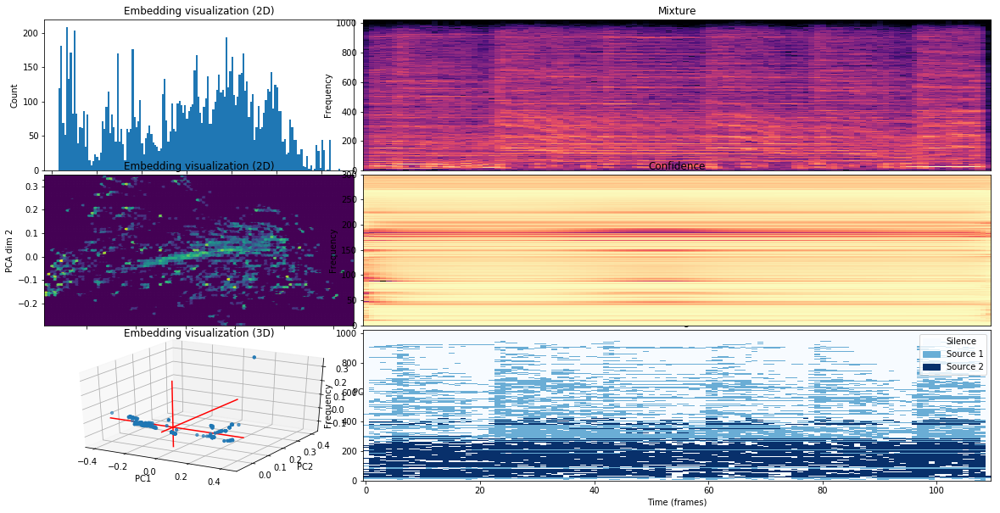

In [0]:
from nussl import efz_utils, jupyter_utils, AudioSignal, DeepClustering
import matplotlib.pyplot as plt
%matplotlib inline

audio_file = efz_utils.download_audio_file('schoolboy_fascination_excerpt.wav')

# see more models and audio files @ http://nussl.ci.northwestern.edu/
model_path = 'results/checkpoints/latest.model.pth'

audio_signal = AudioSignal(audio_file)
audio_signal = AudioSignal(audio_data_array=mus[0].audio, sample_rate=mus[0].rate)
separator = DeepClustering(
    audio_signal,
    model_path=model_path,
    num_sources=2,
    clustering_type='kmeans',
    percentile=95,
)
separator.run()

# Mixture
jupyter_utils.embed_audio(audio_signal)
signals = separator.make_audio_signals()
# Each source
for s in signals:
  jupyter_utils.embed_audio(s)
  
plt.figure(figsize=(20, 10))
separator.plot()
plt.tight_layout()
plt.show()